<font size ="5"> Artificial Intelligence for the Media

<font size="4"> Mini-Project: CycleGAN code

The following notebook is a CycleGAN model adjusted to my dataset, but originally from https://www.kaggle.com/code/songseungwon/cyclegan-tutorial-from-scratch-monet-to-photo. This notebook was used after unsuccessful attempts to train a Pix2Pix model on the same dataset. The only things requiring changing to train this model were the dataset paths found in the fourth cell. 

In [2]:
#import packages

import numpy as np

import torchvision.transforms as transforms
from torchvision.utils import make_grid

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

In [3]:
n_cpu = 2 # number of cpu threads to use during batch generation

In [60]:
#upload data and set parameters

# data (path)
dataset_name = 'CycleGAN_data'
root = 'data/'+ dataset_name

# data (img)
img_height = 512 #originally 256, adjusted to fit my images
img_width = 512 #originally 256, adjusted to fit my images
channels = 3 #rgb

# training
epoch = 0 # epoch to start training from
n_epochs = 5 # number of epochs of training
batch_size = 1 # size of the batches
lr = 0.0002 # adam : learning rate
b1 = 0.5 # adam : decay of first order momentum of gradient
b2 = 0.999 # adam : decay of first order momentum of gradient
decay_epoch = 3 # suggested default : 100 (suggested 'n_epochs' is 200)
                 # epoch from which to start lr decay

In [5]:
#setting up the model 

class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1), # Pads the input tensor using the reflection of the input boundary
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features), 
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features)
        )

    def forward(self, x):
        return x + self.block(x)


class GeneratorResNet(nn.Module):
    def __init__(self, input_shape, num_residual_block):
        super(GeneratorResNet, self).__init__()
        
        channels = input_shape[0]
        
        # Initial Convolution Block
        out_features = 64
        model = [
            nn.ReflectionPad2d(channels),
            nn.Conv2d(channels, out_features, 7),
            nn.InstanceNorm2d(out_features),
            nn.ReLU(inplace=True)
        ]
        in_features = out_features
        
        # Downsampling
        for _ in range(2):
            out_features *= 2
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
        
        # Residual blocks
        for _ in range(num_residual_block):
            model += [ResidualBlock(out_features)]
            
        # Upsampling
        for _ in range(2):
            out_features //= 2
            model += [
                nn.Upsample(scale_factor=2), # --> width*2, heigh*2
                nn.Conv2d(in_features, out_features, 3, stride=1, padding=1),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            
        # Output Layer
        model += [nn.ReflectionPad2d(channels),
                  nn.Conv2d(out_features, channels, 7),
                  nn.Tanh()
                 ]
        
        # Unpacking
        self.model = nn.Sequential(*model) 
        
    def forward(self, x):
        return self.model(x)

<font size = "3" > Looking at what the above model is doing by taking a sample of the data

In [6]:
tensor = torch.from_numpy(np.random.randn(2,2))

In [7]:
tensor

tensor([[ 1.4367,  1.3432],
        [-1.7712,  0.2131]], dtype=torch.float64)

In [8]:
tensor = tensor.view(1,1,2,2)
tensor # nn.Upsample get only 3/4/5D tensor

tensor([[[[ 1.4367,  1.3432],
          [-1.7712,  0.2131]]]], dtype=torch.float64)

In [9]:
test_m = nn.Upsample(scale_factor=2)
test_m(tensor)

tensor([[[[ 1.4367,  1.4367,  1.3432,  1.3432],
          [ 1.4367,  1.4367,  1.3432,  1.3432],
          [-1.7712, -1.7712,  0.2131,  0.2131],
          [-1.7712, -1.7712,  0.2131,  0.2131]]]], dtype=torch.float64)

<font size="4" > Defining more aspects of the model

In [10]:
#defining a discriminator

class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()
        
        channels, height, width = input_shape
        
        # Calculate output shape of image discriminator (PatchGAN)
        self.output_shape = (1, height//2**4, width//2**4)
        
        def discriminator_block(in_filters, out_filters, normalize=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128,256),
            *discriminator_block(256,512),
            nn.ZeroPad2d((1,0,1,0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )
        
    def forward(self, img):
        return self.model(img)

<font size = "3"> Doing a test of the data by padding it with the same padding function used in the discriminator

In [11]:
tensor = torch.from_numpy(np.random.randn(2,2))
tensor

tensor([[-2.4429, -0.5769],
        [ 0.9848,  1.0215]], dtype=torch.float64)

In [12]:
test_m = nn.ZeroPad2d((1,0,0,0)) # Padding_left
test_m(tensor)

tensor([[ 0.0000, -2.4429, -0.5769],
        [ 0.0000,  0.9848,  1.0215]], dtype=torch.float64)

In [13]:
test_m = nn.ZeroPad2d((0,1,0,0)) # Padding_right
test_m(tensor)

tensor([[-2.4429, -0.5769,  0.0000],
        [ 0.9848,  1.0215,  0.0000]], dtype=torch.float64)

In [14]:
test_m = nn.ZeroPad2d((0,0,1,0)) # Padding_top
test_m(tensor)

tensor([[ 0.0000,  0.0000],
        [-2.4429, -0.5769],
        [ 0.9848,  1.0215]], dtype=torch.float64)

In [15]:
test_m = nn.ZeroPad2d((0,0,0,1)) # Padding_bottom
test_m(tensor)

tensor([[-2.4429, -0.5769],
        [ 0.9848,  1.0215],
        [ 0.0000,  0.0000]], dtype=torch.float64)

In [16]:
test_m = nn.ZeroPad2d((1,0,1,0)) # Padding_left and Padding_top
test_m(tensor)

tensor([[ 0.0000,  0.0000,  0.0000],
        [ 0.0000, -2.4429, -0.5769],
        [ 0.0000,  0.9848,  1.0215]], dtype=torch.float64)

<font size = "4" > Defining Additional Aspects of the Model

In [17]:
#defining loss functions

criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

In [18]:
#setting variables for our Generator and Discriminator running through our inputs

input_shape = (channels, img_height, img_width) # (3,256,256)
n_residual_blocks = 9 # suggested default, number of residual blocks in generator

G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)

In [19]:
#applying cude to the above variables

cuda = torch.cuda.is_available()

if cuda:
    G_AB = G_AB.cuda()
    G_BA = G_BA.cuda()
    D_A = D_A.cuda()
    D_B = D_B.cuda()
    
    criterion_GAN.cuda()
    criterion_cycle.cuda()
    criterion_identity.cuda()

In [20]:
#defining our weights

def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02) # reset Conv2d's weight(tensor) with Gaussian Distribution
        if hasattr(m, 'bias') and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0) # reset Conv2d's bias(tensor) with Constant(0)
        elif classname.find('BatchNorm2d') != -1:
            torch.nn.init.normal_(m.weight.data, 1.0, 0.02) # reset BatchNorm2d's weight(tensor) with Gaussian Distribution
            torch.nn.init.constant_(m.bias.data, 0.0) # reset BatchNorm2d's bias(tensor) with Constant(0)

In [21]:
#applying the weights to our variables

G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): ZeroPad2d((1, 0, 1, 0))
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

<font size = "4" > Looking at how are weights apply to and manipulate our data

In [22]:
def temp_weights_init_normal(m):
    classname =  m.__class__.__name__
    print(classname)

In [23]:
G_AB.apply(temp_weights_init_normal);

ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
Conv2d
InstanceNorm2d
ReLU
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPad2d
Conv2d
InstanceNorm2d
Sequential
ResidualBlock
ReflectionPad2d
Conv2d
InstanceNorm2d
ReLU
ReflectionPa

In [24]:
temp_w = torch.ones(2,5)
temp_w

tensor([[1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.]])

In [25]:
nn.init.normal_(temp_w)

tensor([[ 0.4344,  1.3099,  0.5188, -0.5581,  1.0558],
        [-0.7477, -0.6669, -2.0415,  0.7196, -1.1166]])

In [26]:
temp_w2 = torch.empty(2,5)
temp_w2

tensor([[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.]])

In [27]:
nn.init.constant_(temp_w2, 1)

tensor([[1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.]])

<font size = "4" > Defining additional parameters to train our model

In [28]:
#defining our optimizer

import itertools
# lr = 0.0002
# b1 = 0.5
# b2 = 0.999

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr, betas=(b1,b2)
)

optimizer_D_A = torch.optim.Adam(
    D_A.parameters(), lr=lr, betas=(b1,b2)
)
optimizer_D_B = torch.optim.Adam(
    D_B.parameters(), lr=lr, betas=(b1,b2)
)

In [29]:
#setting the number of epochs, delay, and offset

class LambdaLR:
    def __init__(self, n_epochs, offset, decay_start_epoch):
        assert (n_epochs - decay_start_epoch) > 0, "Decay must start before the training session ends!"
        self.n_epochs = n_epochs
        self.offset = offset
        self.decay_start_epoch = decay_start_epoch
        
    def step(self, epoch):
        return 1.0 - max(0, epoch+self.offset - self.decay_start_epoch)/(self.n_epochs - self.decay_start_epoch)

In [30]:
# n_epochs = 10
# epoch = 0
# decay_epoch = 5


lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(
    optimizer_G,
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_A,
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)
lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_B,
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

In [31]:
#defining the transforms applied to the data

from PIL import Image
import torchvision.transforms as transforms

transforms_ = [
    transforms.Resize(int(img_height*1.12), Image.BICUBIC),
    transforms.RandomCrop((img_height, img_width)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
]

/Users/marissabeaty/miniconda3/envs/pytorch/lib/python3.10/site-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(


In [32]:
#saving the image as RGB

def to_rgb(image):
    rgb_image = Image.new("RGB", image.size)
    rgb_image.paste(image)
    return rgb_image

In [33]:
import os
import glob

In [64]:
#double checking our function will correctly read in all image files by checking the length of the folder

len(glob.glob(root+'/edges/*.png'))

400

In [68]:
#double checking our function will correctly read in all image files by checking the length of the folder

len(glob.glob(root+'/real/*.png'))

400

In [72]:
#getting the images and transforming them for training

from torch.utils.data import Dataset

class ImageDataset(Dataset):
    def __init__(self, root, transforms_=None, unaligned=False, mode='train'):
        self.transform = transforms.Compose(transforms_)
        self.unaligned = unaligned
        self.mode = mode
        if self.mode == 'train':
            self.files_A = sorted(glob.glob(root+'/edges/*.png'))[:250]
            self.files_B = sorted(glob.glob(root+'/real/*.png'))[:250]
        elif self.mode == 'test':
            self.files_A = sorted(glob.glob(root+'/edges/*.png'))[:250]
            self.files_B = sorted(glob.glob(root+'/real/*.png'))[250:301]

    def  __getitem__(self, index):
        image_A = Image.open(self.files_A[index % len(self.files_A)])
        
        if self.unaligned:
            image_B = Image.open(self.files_B[np.random.randint(0, len(self.files_B)-1)])
        else:
            image_B = Image.open(self.files_B[index % len(self.files_B)])
        if image_A.mode != 'RGB':
            image_A = to_rgb(image_A)
        if image_B.mode != 'RGB':
            image_B = to_rgb(image_B)
            
        item_A = self.transform(image_A)
        item_B = self.transform(image_B)
        return {'A':item_A, 'B':item_B}
    
    def __len__(self):
        return max(len(self.files_A), len(self.files_B))

In [81]:
#defining our dataloader for training and validation

dataloader = DataLoader(
    ImageDataset(root, transforms_=transforms_, unaligned=True),
    batch_size=1, # 1
    shuffle=True,
    num_workers=0 # 3
)

val_dataloader = DataLoader(
    ImageDataset(root, transforms_=transforms_, unaligned=True, mode='test'),
    batch_size=5,
    shuffle=True,
    num_workers=0
)

In [74]:
import matplotlib.pyplot as plt

In [75]:
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

<font size = "4"> The next section is applying the above defined functions and classes to a sample set of the images to ensure they are working as they should. 

In [76]:
def sample_images():
    """show a generated sample from the test set"""
    imgs = next(iter(val_dataloader))
    G_AB.eval()
    G_BA.eval()
    real_A = imgs['A'].type(Tensor) # A : edges
    fake_B = G_AB(real_A).detach()
    real_B = imgs['B'].type(Tensor) # B : real
    fake_A = G_BA(real_B).detach()
    # Arrange images along x-axis
    real_A = make_grid(real_A, nrow=5, normalize=True)
    fake_B = make_grid(fake_B, nrow=5, normalize=True)
    real_B = make_grid(real_B, nrow=5, normalize=True)
    fake_A = make_grid(fake_A, nrow=5, normalize=True)
    # Arrange images along y-axis    
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)
    plt.imshow(image_grid.cpu().permute(1,2,0))
    plt.title('Real A vs Fake B | Real B vs Fake A')
    plt.axis('off')
    plt.show();

In [82]:
temp_imgs = next(iter(val_dataloader))

In [83]:
G_AB.eval() # test mode 
G_BA.eval() # test mode
print(temp_imgs['A'].shape)
print(temp_imgs['B'].shape)

torch.Size([5, 3, 512, 512])
torch.Size([5, 3, 512, 512])


In [84]:
temp_real_A = temp_imgs['A'].type(Tensor) # A : edges
temp_fake_B = G_AB(temp_real_A).detach()
temp_real_B = temp_imgs['B'].type(Tensor) # B : real
temp_fake_A = G_BA(temp_real_B).detach()

In [85]:
print(temp_real_A.shape)
print(temp_fake_B.shape)
print(temp_real_B.shape)
print(temp_fake_A.shape)

torch.Size([5, 3, 512, 512])
torch.Size([5, 3, 512, 512])
torch.Size([5, 3, 512, 512])
torch.Size([5, 3, 512, 512])


In [86]:
temp_real_A = make_grid(temp_real_A, nrow=5, normalize=True)
temp_real_B = make_grid(temp_real_B, nrow=5, normalize=True)
temp_fake_A = make_grid(temp_fake_A, nrow=5, normalize=True)
temp_fake_B = make_grid(temp_fake_B, nrow=5, normalize=True)

In [87]:
type(temp_real_A)

torch.Tensor

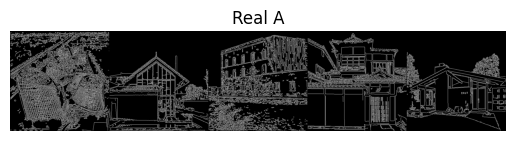

In [88]:
plt.imshow(temp_real_A.cpu().permute(1,2,0))
plt.title('Real A')
plt.axis('off');

In [89]:
print(temp_real_A.shape)
print(temp_fake_B.shape)
print(temp_real_B.shape)
print(temp_fake_A.shape)

torch.Size([3, 516, 2572])
torch.Size([3, 516, 2572])
torch.Size([3, 516, 2572])
torch.Size([3, 516, 2572])


In [90]:
temp_image_grid = torch.cat((temp_real_A, temp_fake_A, temp_real_B, temp_fake_B), 1)
print(temp_image_grid.shape)

torch.Size([3, 2064, 2572])


In [91]:
temp_image_grid.cpu().permute(1,2,0).shape

torch.Size([2064, 2572, 3])

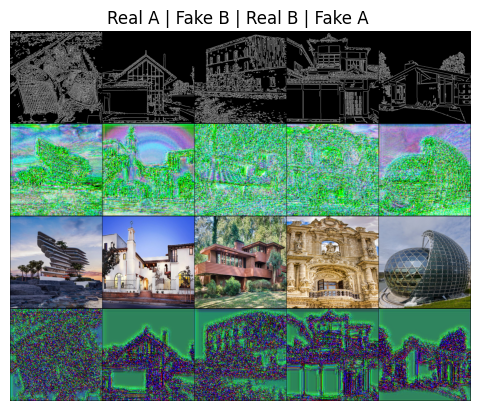

In [92]:
plt.imshow(temp_image_grid.cpu().permute(1,2,0))
plt.title('Real A | Fake B | Real B | Fake A ')
plt.axis('off');

<font size="4"> Training the Model on my Dataset

In [93]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings

  0%|          | 0/250 [00:00<?, ?it/s]

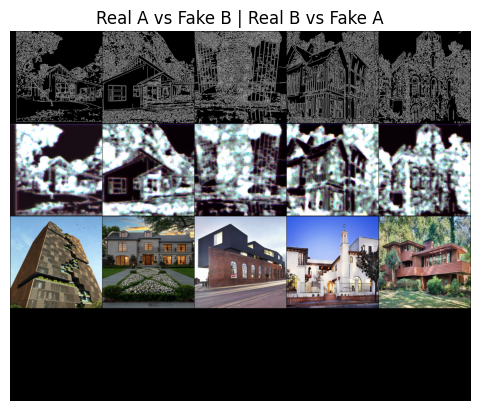

[Epoch 1/5] [Batch 50/250] [D loss : 0.729466] [G loss : 6.735279 - (adv : 0.675576, cycle : 0.474289, identity : 0.263363)]


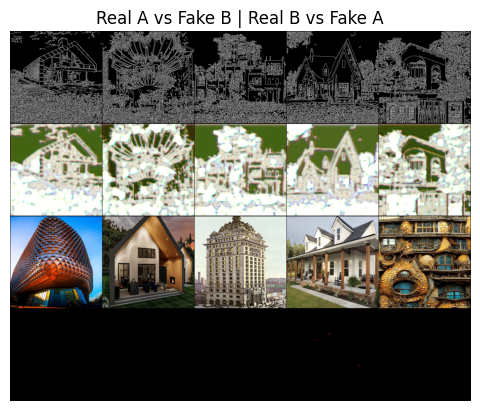

[Epoch 1/5] [Batch 100/250] [D loss : 0.167593] [G loss : 4.589911 - (adv : 0.710600, cycle : 0.309999, identity : 0.155864)]


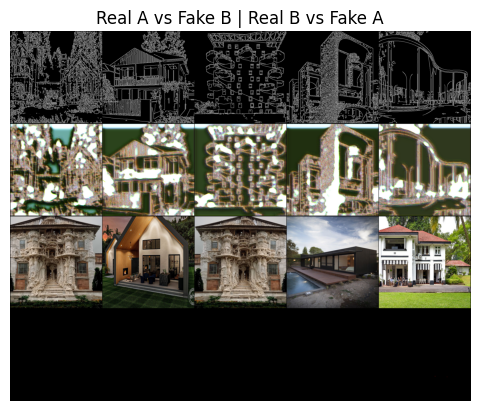

[Epoch 1/5] [Batch 150/250] [D loss : 0.142730] [G loss : 5.560685 - (adv : 0.645110, cycle : 0.365687, identity : 0.251740)]


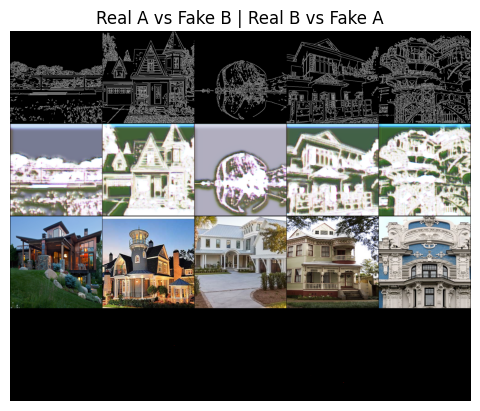

[Epoch 1/5] [Batch 200/250] [D loss : 0.131058] [G loss : 7.412329 - (adv : 0.665927, cycle : 0.525213, identity : 0.298854)]


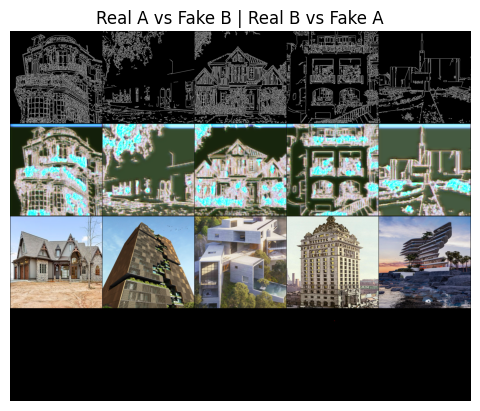

[Epoch 1/5] [Batch 250/250] [D loss : 0.115664] [G loss : 4.362143 - (adv : 0.699391, cycle : 0.277637, identity : 0.177276)]


  0%|          | 0/250 [00:00<?, ?it/s]

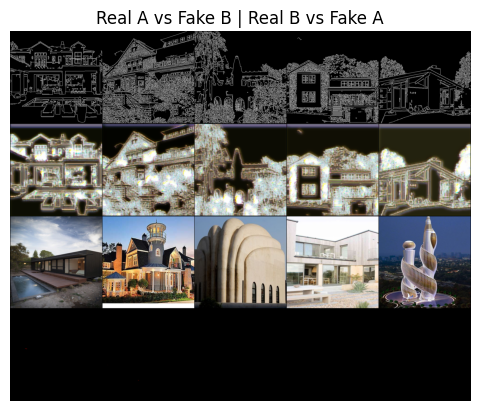

[Epoch 2/5] [Batch 50/250] [D loss : 0.162323] [G loss : 5.342338 - (adv : 0.779157, cycle : 0.357537, identity : 0.197563)]


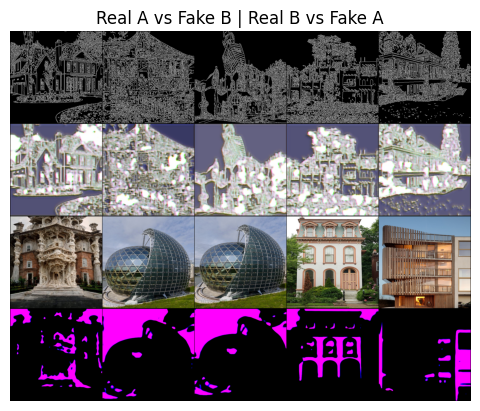

[Epoch 2/5] [Batch 100/250] [D loss : 0.218793] [G loss : 4.948836 - (adv : 0.570298, cycle : 0.318758, identity : 0.238192)]


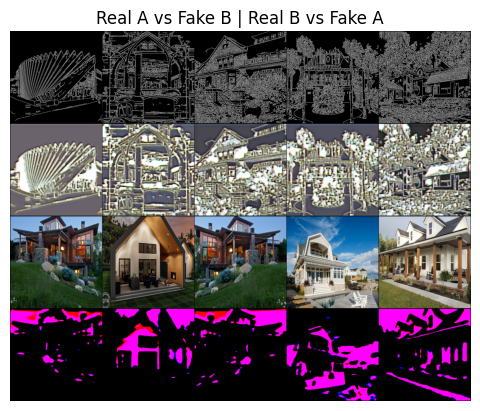

[Epoch 2/5] [Batch 150/250] [D loss : 0.167224] [G loss : 7.780740 - (adv : 0.496987, cycle : 0.505243, identity : 0.446264)]


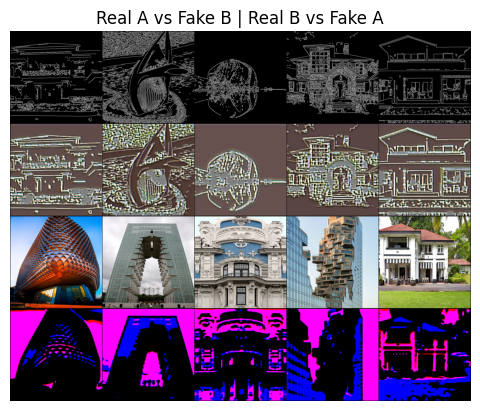

[Epoch 2/5] [Batch 200/250] [D loss : 0.078697] [G loss : 5.743520 - (adv : 0.736848, cycle : 0.350720, identity : 0.299895)]


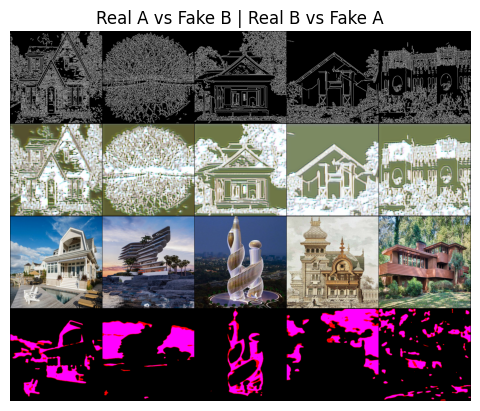

[Epoch 2/5] [Batch 250/250] [D loss : 0.100799] [G loss : 4.901756 - (adv : 0.734111, cycle : 0.300381, identity : 0.232766)]


  0%|          | 0/250 [00:00<?, ?it/s]

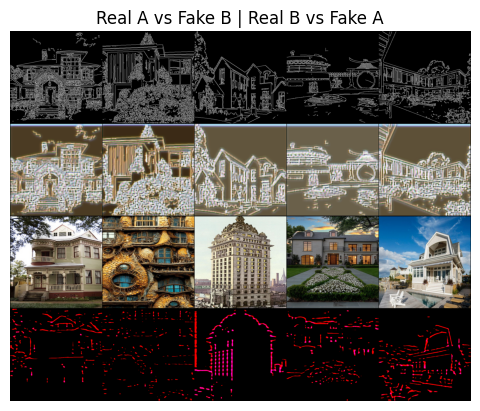

[Epoch 3/5] [Batch 50/250] [D loss : 0.108327] [G loss : 7.961337 - (adv : 0.733181, cycle : 0.493584, identity : 0.458464)]


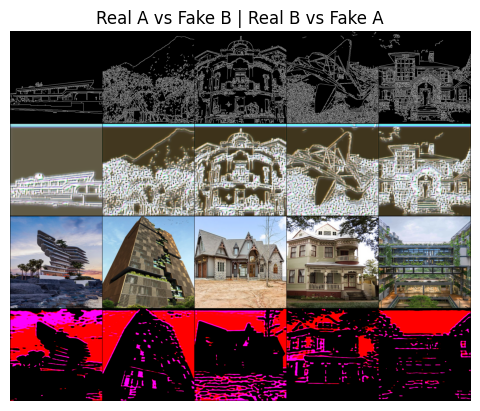

[Epoch 3/5] [Batch 100/250] [D loss : 0.138035] [G loss : 3.588329 - (adv : 0.631597, cycle : 0.217872, identity : 0.155603)]


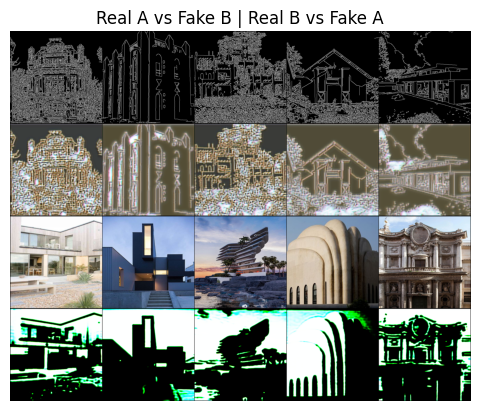

[Epoch 3/5] [Batch 150/250] [D loss : 0.171561] [G loss : 6.216552 - (adv : 0.293673, cycle : 0.426178, identity : 0.332219)]


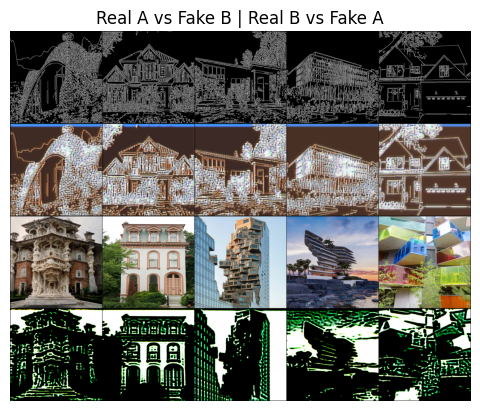

[Epoch 3/5] [Batch 200/250] [D loss : 0.219460] [G loss : 3.732706 - (adv : 0.452151, cycle : 0.227972, identity : 0.200168)]


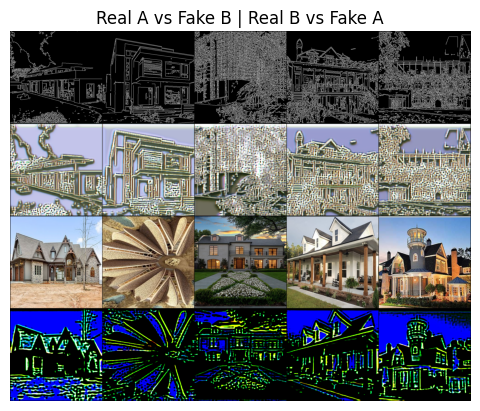

[Epoch 3/5] [Batch 250/250] [D loss : 0.156169] [G loss : 4.326787 - (adv : 0.436962, cycle : 0.274421, identity : 0.229124)]


  0%|          | 0/250 [00:00<?, ?it/s]

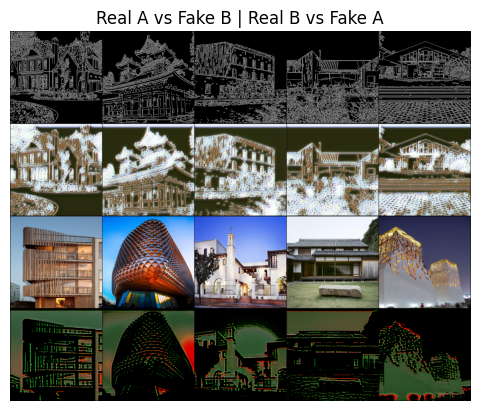

[Epoch 4/5] [Batch 50/250] [D loss : 0.187944] [G loss : 5.006412 - (adv : 0.403652, cycle : 0.296478, identity : 0.327596)]


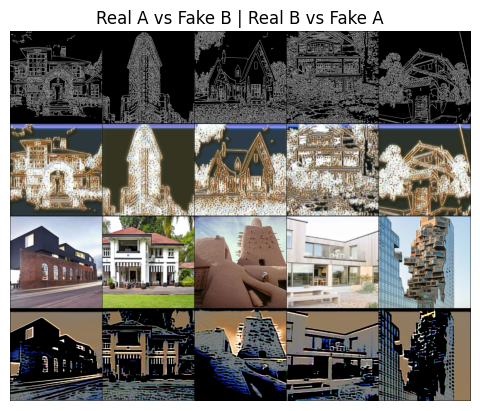

[Epoch 4/5] [Batch 100/250] [D loss : 0.224026] [G loss : 3.346159 - (adv : 0.386890, cycle : 0.206228, identity : 0.179397)]


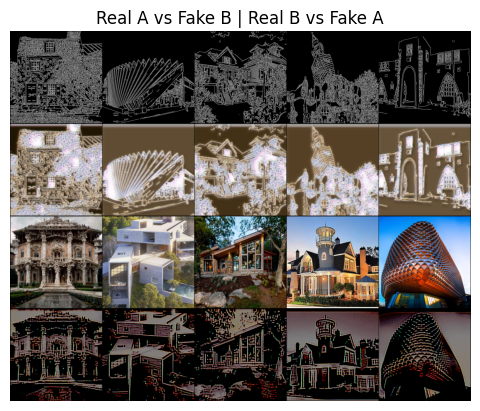

[Epoch 4/5] [Batch 150/250] [D loss : 0.135721] [G loss : 6.015532 - (adv : 0.832510, cycle : 0.351507, identity : 0.333590)]


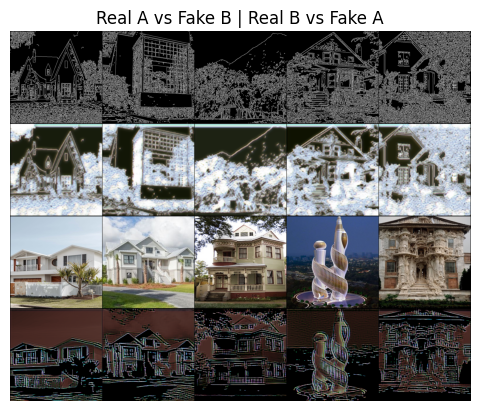

[Epoch 4/5] [Batch 200/250] [D loss : 0.139228] [G loss : 3.967206 - (adv : 0.571143, cycle : 0.231918, identity : 0.215377)]


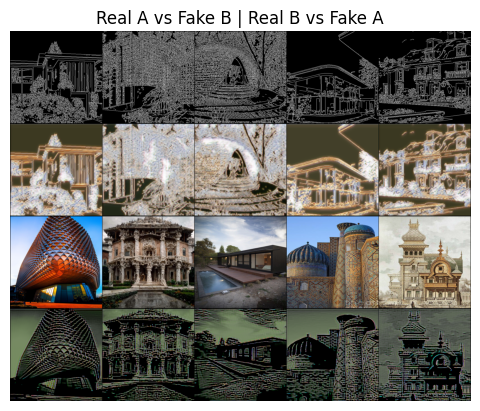

[Epoch 4/5] [Batch 250/250] [D loss : 0.146445] [G loss : 5.501998 - (adv : 1.199817, cycle : 0.297836, identity : 0.264764)]


  0%|          | 0/250 [00:00<?, ?it/s]

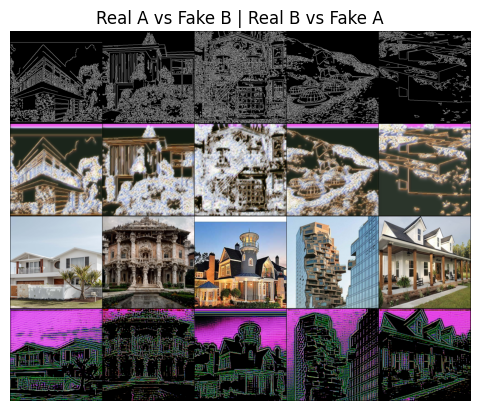

[Epoch 5/5] [Batch 50/250] [D loss : 0.144810] [G loss : 5.463828 - (adv : 1.161213, cycle : 0.295467, identity : 0.269589)]


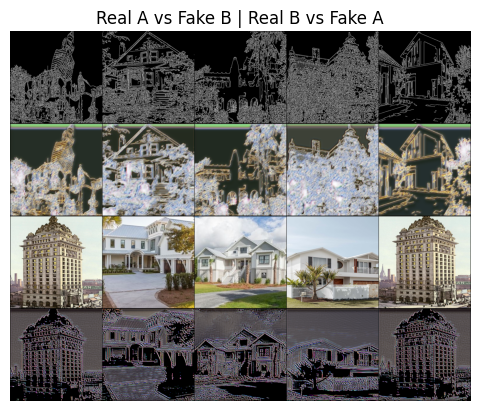

[Epoch 5/5] [Batch 100/250] [D loss : 0.234878] [G loss : 5.684030 - (adv : 0.866289, cycle : 0.337545, identity : 0.288457)]


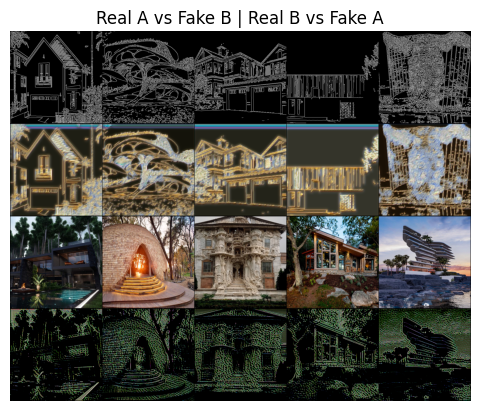

[Epoch 5/5] [Batch 150/250] [D loss : 0.228297] [G loss : 5.707891 - (adv : 0.240126, cycle : 0.382138, identity : 0.329276)]


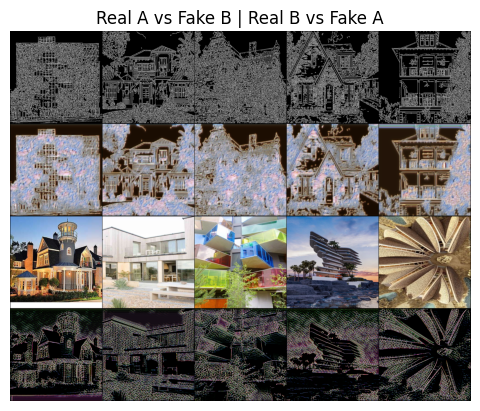

[Epoch 5/5] [Batch 200/250] [D loss : 0.242657] [G loss : 4.428405 - (adv : 0.183748, cycle : 0.294566, identity : 0.259800)]


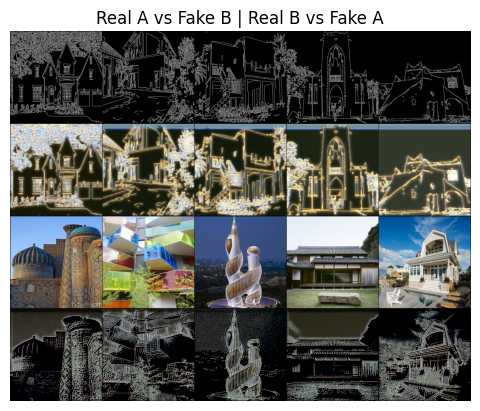

[Epoch 5/5] [Batch 250/250] [D loss : 0.211869] [G loss : 6.356750 - (adv : 0.479928, cycle : 0.418148, identity : 0.339068)]


In [94]:
#our model

for epoch in range(epoch, n_epochs):
    for i, batch in enumerate(tqdm(dataloader)):
        
        # Set model input
        real_A = batch['A'].type(Tensor)
        real_B = batch['B'].type(Tensor)
        
        # Adversarial ground truths
        valid = Tensor(np.ones((real_A.size(0), *D_A.output_shape))) # requires_grad = False. Default.
        fake = Tensor(np.zeros((real_A.size(0), *D_A.output_shape))) # requires_grad = False. Default.
        
# -----------------
# Train Generators
# -----------------
        G_AB.train() # train mode
        G_BA.train() # train mode
        
        optimizer_G.zero_grad() # Integrated optimizer(G_AB, G_BA)
        
        # Identity Loss
        loss_id_A = criterion_identity(G_BA(real_A), real_A) # If you put A into a generator that creates A with B,
        loss_id_B = criterion_identity(G_AB(real_B), real_B) # then of course A must come out as it is.
                                                             # Taking this into consideration, add an identity loss that simply compares 'A and A' (or 'B and B').
        loss_identity = (loss_id_A + loss_id_B)/2
        
        # GAN Loss
        fake_B = G_AB(real_A) # fake_B is fake-photo that generated by real monet-drawing
        loss_GAN_AB = criterion_GAN(D_B(fake_B), valid) # tricking the 'fake-B' into 'real-B'
        fake_A = G_BA(real_B)
        loss_GAN_BA = criterion_GAN(D_A(fake_A), valid) # tricking the 'fake-A' into 'real-A'
        
        loss_GAN = (loss_GAN_AB + loss_GAN_BA)/2
        
        # Cycle Loss
        recov_A = G_BA(fake_B) # recov_A is fake-monet-drawing that generated by fake-photo
        loss_cycle_A = criterion_cycle(recov_A, real_A) # Reduces the difference between the restored image and the real image
        recov_B = G_AB(fake_A)
        loss_cycle_B = criterion_cycle(recov_B, real_B)
        
        loss_cycle = (loss_cycle_A + loss_cycle_B)/2
        
# ------> Total Loss
        loss_G = loss_GAN + (10.0*loss_cycle) + (5.0*loss_identity) # multiply suggested weight(default cycle loss weight : 10, default identity loss weight : 5)
        
        loss_G.backward()
        optimizer_G.step()
        
# -----------------
# Train Discriminator A
# -----------------
        optimizer_D_A.zero_grad()
    
        loss_real = criterion_GAN(D_A(real_A), valid) # train to discriminate real images as real
        loss_fake = criterion_GAN(D_A(fake_A.detach()), fake) # train to discriminate fake images as fake
        
        loss_D_A = (loss_real + loss_fake)/2
        
        loss_D_A.backward()
        optimizer_D_A.step()

# -----------------
# Train Discriminator B
# -----------------
        optimizer_D_B.zero_grad()
    
        loss_real = criterion_GAN(D_B(real_B), valid) # train to discriminate real images as real
        loss_fake = criterion_GAN(D_B(fake_B.detach()), fake) # train to discriminate fake images as fake
        
        loss_D_B = (loss_real + loss_fake)/2
        
        loss_D_B.backward()
        optimizer_D_B.step()
        
# ------> Total Loss
        loss_D = (loss_D_A + loss_D_B)/2
    
# -----------------
# Show Progress
# -----------------
        if (i+1) % 50 == 0:
            sample_images()
            print('[Epoch %d/%d] [Batch %d/%d] [D loss : %f] [G loss : %f - (adv : %f, cycle : %f, identity : %f)]'
                    %(epoch+1,n_epochs,       # [Epoch -]
                      i+1,len(dataloader),   # [Batch -]
                      loss_D.item(),       # [D loss -]
                      loss_G.item(),       # [G loss -]
                      loss_GAN.item(),     # [adv -]
                      loss_cycle.item(),   # [cycle -]
                      loss_identity.item(),# [identity -]
                     ))

<font size="4"> The next session is taking a look at the images produced during training

In [95]:
for i, batch in enumerate(dataloader):
    print('iter : {}  A.size : {}'.format(i,batch['A'].size()))
    print('iter : {}  B.size : {}'.format(i,batch['B'].size()))
    if i == 10:
        break

iter : 0  A.size : torch.Size([1, 3, 512, 512])
iter : 0  B.size : torch.Size([1, 3, 512, 512])
iter : 1  A.size : torch.Size([1, 3, 512, 512])
iter : 1  B.size : torch.Size([1, 3, 512, 512])
iter : 2  A.size : torch.Size([1, 3, 512, 512])
iter : 2  B.size : torch.Size([1, 3, 512, 512])
iter : 3  A.size : torch.Size([1, 3, 512, 512])
iter : 3  B.size : torch.Size([1, 3, 512, 512])
iter : 4  A.size : torch.Size([1, 3, 512, 512])
iter : 4  B.size : torch.Size([1, 3, 512, 512])
iter : 5  A.size : torch.Size([1, 3, 512, 512])
iter : 5  B.size : torch.Size([1, 3, 512, 512])
iter : 6  A.size : torch.Size([1, 3, 512, 512])
iter : 6  B.size : torch.Size([1, 3, 512, 512])
iter : 7  A.size : torch.Size([1, 3, 512, 512])
iter : 7  B.size : torch.Size([1, 3, 512, 512])
iter : 8  A.size : torch.Size([1, 3, 512, 512])
iter : 8  B.size : torch.Size([1, 3, 512, 512])
iter : 9  A.size : torch.Size([1, 3, 512, 512])
iter : 9  B.size : torch.Size([1, 3, 512, 512])
iter : 10  A.size : torch.Size([1, 3, 51

In [96]:
temp_A = batch['A'].type(Tensor)

In [97]:
temp_A.shape

torch.Size([1, 3, 512, 512])

In [98]:
temp_img = temp_A.squeeze()
temp_img = temp_img.cpu().permute(1,2,0).numpy()

In [99]:
temp_img.shape

(512, 512, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


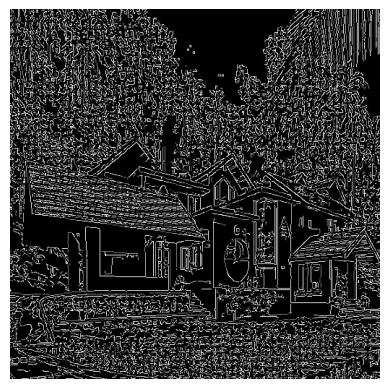

In [100]:
plt.imshow(temp_img)
plt.axis('off');

In [101]:
D_A.output_shape

(1, 32, 32)

In [102]:
temp_A.size()

torch.Size([1, 3, 512, 512])

In [103]:
temp_A.size(0) # batch_size

1

In [104]:
Tensor(np.ones((temp_A.size(0), *D_A.output_shape)))

tensor([[[[1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.]]]])

In [105]:
Tensor(np.ones((temp_A.size(0), *D_A.output_shape))).shape

torch.Size([1, 1, 32, 32])

Using the CycleGAN model, we were able to successfully train the model on our image dataset that did not work with the Pix2Pix model. The only things that had to be changed from this model were the image paths. 